In [21]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import os
from IPython.display import display
from matplotlib.lines import Line2D
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300
sns.set_style('whitegrid')

In [22]:
def read_csv_files_from_folder(folder_path):
    # Initialize an empty list to store DataFrames
    dfs = []
    # Get a list of files in the folder
    file_list = os.listdir(folder_path)
    # Iterate through the files in the folder
    for file_name in file_list:
        # Check if the file has a .csv extension
        if file_name.endswith(".csv"):
            file_path = os.path.join(folder_path, file_name)

            # Read the CSV file into a DataFrame
            df = pd.read_csv(file_path)

            # Append the DataFrame to the list
            dfs.append(df)

    # Concatenate all DataFrames into a single DataFrame
    combined_df = pd.concat(dfs, ignore_index=True)
    return combined_df

In [23]:
cols = ['dataset', 'method', 'fitness_rule', 'fitness', 'ACC', 'MCC', 'avg_odds_diff', 'stat_par_diff', 'eq_opp_diff']

In [24]:
results = read_csv_files_from_folder('../2024-05-08/results')
methods = ['simple_mlp_initializer', 'mlp_xi_reg_initializer', 'ftl_mlp_initializer', 'ftl_mlp_xi_reg_initializer']


results.replace({'simple_mlp_initializer': r'MLP'}, inplace=True)
results.replace({'mlp_xi_reg_initializer': r'MLP+RPR$_{\xi}$'}, inplace=True)
results.replace({'ftl_mlp_initializer': r'FTL'}, inplace=True)
results.replace({'ftl_mlp_xi_reg_initializer': r'FTL+RPR$_{\xi}$'}, inplace=True)

results.replace({'adult_dataset_reader': 'Adult Income', 'compas_dataset_reader': 'Compas Recidivism', 'german_dataset_reader': 'German Credit', 'bank_dataset_reader': 'Bank Marketing'}, inplace=True)
results.rename(columns={'avg_odds_diff': 'Equalized Odds', 'stat_par_diff': 'Statistical Parity', 'eq_opp_diff': 'Equal Opportunity', 'MCC': 'Mathew Correlation', 'ACC': 'Accuracy'}, inplace=True)

results

,Index,overall_acc,bal_acc,Equalized Odds,disp_imp,Statistical Parity,Equal Opportunity,theil_ind,TPR,TNR,...,f1_score,fitness,solution,corr,fitness_rule,method,dataset,best_solution_tf_history,Unnamed: 0,tune_results_history
0,36.0,0.834936,0.773424,0.105715,0.749300,0.065635,0.192739,0.121793,0.646253,0.900596,...,0.669031,0.494246,"{'corr_type': 'pearson', 'l2': 0.0, 'dropout':...","[0.07977566008940401, 0.0008965647325704729, 0...",mcc_parity,FTL,Adult Income,"{'loss': [0.5002829060276536, 0.47760909892786...",NaN,NaN
1,37.0,0.844002,0.780294,0.049059,0.407614,0.170094,0.018271,0.115943,0.652155,0.908433,...,0.677633,0.526651,"{'corr_type': 'pearson', 'l2': 0.0, 'dropout':...","[0.08392866271270276, 0.003902499570566557, 0....",mcc_odds,FTL,Adult Income,"{'loss': [0.5228845256078762, 0.50544403579674...",NaN,NaN
2,38.0,0.823328,0.824797,0.099124,0.385690,0.259137,0.061543,0.082246,0.827664,0.821930,...,0.695503,0.528761,"{'corr_type': 'pearson', 'l2': 0.0, 'dropout':...","[0.07885223051649136, 0.0022813842671083693, 1...",mcc_opportunity,FTL,Adult Income,"{'loss': [0.40941930077154237, 0.3801981820613...",NaN,NaN
3,39.0,0.836263,0.706579,0.024246,0.359515,0.107601,0.027139,0.163380,0.440656,0.972503,...,0.579620,0.728663,"{'corr_type': 'pearson', 'l2': 0.0, 'dropout':...","[0.07787517408620503, 2.246978263011198e-05, 0...",acc_parity,FTL,Adult Income,"{'loss': [0.8860432654275967, 0.87261052768394...",NaN,NaN
4,40.0,0.839469,0.713643,0.015181,0.410020,0.104461,0.002116,0.153518,0.464877,0.962408,...,0.588669,0.824289,"{'corr_type': 'pearson', 'l2': 0.0, 'dropout':...","[0.08580499697981567, 0.00525015314724385, 1.0...",acc_odds,FTL,Adult Income,"{'loss': [0.6216279075019698, 0.59390508692872...",NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3692,NaN,0.790000,0.736491,0.043091,1.016502,0.011905,0.072250,0.150080,0.850340,0.622642,...,0.856164,0.424402,"{'dropout': 0.09627165796913209, 'privileged_d...",NaN,mcc_odds,FTL,German Credit,"{'loss': [0.6376810073852539, 0.61503809690475...",19.0,"[{'overall_acc': 0.4125, 'bal_acc': 0.51663968..."
3693,NaN,0.790000,0.688927,0.151803,1.142244,0.110883,0.107527,0.095466,0.929577,0.448276,...,0.862745,0.338754,"{'dropout': 0.08768559611858262, 'privileged_d...",NaN,mcc_opportunity,FTL,German Credit,"{'loss': [0.6772245764732361, 0.64736610651016...",20.0,"[{'overall_acc': 0.24375, 'bal_acc': 0.4461339..."
3694,NaN,0.640000,0.587186,0.088931,0.888889,0.078125,0.056122,0.255102,0.729927,0.444444,...,0.735294,0.561875,"{'dropout': 0.17388236828937342, 'privileged_d...",NaN,acc_parity,FTL,German Credit,"{'loss': [0.6499606370925903, 0.61459320783615...",21.0,"[{'overall_acc': 0.625, 'bal_acc': 0.5, 'avg_o..."
3695,NaN,0.720000,0.573337,0.046663,1.032787,0.028571,0.071446,0.109591,0.922535,0.224138,...,0.823899,0.673337,"{'dropout': 0.03445845309731452, 'privileged_d...",NaN,acc_odds,FTL,German Credit,"{'loss': [0.7265857458114624, 0.68753087520599...",22.0,"[{'overall_acc': 0.7125, 'bal_acc': 0.70747520..."


In [25]:
datasets = results['dataset'].unique().tolist()
datasets

['Adult Income', 'Bank Marketing', 'Compas Recidivism', 'German Credit']

In [26]:
fitness_rules = results['fitness_rule'].unique().tolist()
fitness_rules

['mcc_parity',
 'mcc_odds',
 'mcc_opportunity',
 'acc_parity',
 'acc_odds',
 'acc_opportunity']

In [27]:
fitness_rules_target_metrics = {
    'mcc_parity': ('Mathew Correlation', 'Statistical Parity'),
    'mcc_opportunity': ('Mathew Correlation', 'Equal Opportunity'),
    'mcc_odds': ('Mathew Correlation', 'Equalized Odds'),
    'acc_parity': ('Accuracy', 'Statistical Parity'),
    'acc_opportunity': ('Accuracy', 'Equal Opportunity'),
    'acc_odds': ('Accuracy', 'Equalized Odds')
}
fitness_rules_abvr = {
    'mcc_parity': 'Max(MCC - Stat. Parity)',
    'mcc_opportunity': 'Max(MCC - Eq. Odds)',
    'mcc_odds': 'Max(MCC - Eq. Opp.)',
    'acc_parity': 'Max(Acc - Stat. Parity)',
    'acc_opportunity': 'Max(Acc - Eq. Odds)',
    'acc_odds':  'Max(Acc - Eq. Opp.)'
}

In [28]:
results['Performance'] = 0
results['Fairness'] = 0
results['Fitness Rule'] = ''
for fitness_rule, (performance_metric, fairness_metric) in fitness_rules_target_metrics.items():
    results.loc[results.fitness_rule == fitness_rule,'Performance'] = results.loc[results.fitness_rule == fitness_rule,performance_metric]
    results.loc[results.fitness_rule == fitness_rule,'Fairness'] = results.loc[results.fitness_rule == fitness_rule,fairness_metric]
    results.loc[results.fitness_rule == fitness_rule,'Fitness Rule Abvr'] = fitness_rules_abvr[fitness_rule]
    results.loc[results.fitness_rule == fitness_rule,'Fitness Rule'] = 'Max(%s - %s)' % fitness_rules_target_metrics[fitness_rule]

display(results)

/tmp/ipykernel_2230456/211384797.py:5: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0.55988104 0.49558867 0.47660518 0.53020884 0.49731155 0.48088379
 0.50936495 0.52610501 0.50501965 0.49517103 0.52255177 0.48277552
 0.49360563 0.49928347 0.49428572 0.50830079 0.5315851  0.49084885
 0.49727459 0.52602458 0.51498102 0.49446574 0.52981801 0.51333191
 0.51460142 0.49477946 0.4559726  0.49333343 0.53090834 0.49284321
 0.48727491 0.46760391 0.48532912 0.48816006 0.49060769 0.50033309
 0.54306751 0.52179051 0.4829124  0.51199556 0.52334945 0.50003926
 0.58517004 0.58512823 0.5840247  0.5836371  0.57625737 0.5769683
 0.58075151 0.57811729 0.57147862 0.55847176 0.56402881 0.58191431
 0.58343253 0.57740222 0.51579307 0.30958237 0.37962947 0.55899189
 0.53558872 0.2598879  0.57717035 0.50086739 0.33275221 0.37929293
 0.47729109 0.29196869 0.29037704 0.52303609 0.27480633 0.38668781
 0.50626951 0.29960979 0.4042848  0.5211

,Index,overall_acc,bal_acc,Equalized Odds,disp_imp,Statistical Parity,Equal Opportunity,theil_ind,TPR,TNR,...,fitness_rule,method,dataset,best_solution_tf_history,Unnamed: 0,tune_results_history,Performance,Fairness,Fitness Rule,Fitness Rule Abvr
0,36.0,0.834936,0.773424,0.105715,0.749300,0.065635,0.192739,0.121793,0.646253,0.900596,...,mcc_parity,FTL,Adult Income,"{'loss': [0.5002829060276536, 0.47760909892786...",NaN,NaN,0.559881,0.065635,Max(Mathew Correlation - Statistical Parity),Max(MCC - Stat. Parity)
1,37.0,0.844002,0.780294,0.049059,0.407614,0.170094,0.018271,0.115943,0.652155,0.908433,...,mcc_odds,FTL,Adult Income,"{'loss': [0.5228845256078762, 0.50544403579674...",NaN,NaN,0.575709,0.049059,Max(Mathew Correlation - Equalized Odds),Max(MCC - Eq. Opp.)
2,38.0,0.823328,0.824797,0.099124,0.385690,0.259137,0.061543,0.082246,0.827664,0.821930,...,mcc_opportunity,FTL,Adult Income,"{'loss': [0.40941930077154237, 0.3801981820613...",NaN,NaN,0.590304,0.061543,Max(Mathew Correlation - Equal Opportunity),Max(MCC - Eq. Odds)
3,39.0,0.836263,0.706579,0.024246,0.359515,0.107601,0.027139,0.163380,0.440656,0.972503,...,acc_parity,FTL,Adult Income,"{'loss': [0.8860432654275967, 0.87261052768394...",NaN,NaN,0.836263,0.107601,Max(Accuracy - Statistical Parity),Max(Acc - Stat. Parity)
4,40.0,0.839469,0.713643,0.015181,0.410020,0.104461,0.002116,0.153518,0.464877,0.962408,...,acc_odds,FTL,Adult Income,"{'loss': [0.6216279075019698, 0.59390508692872...",NaN,NaN,0.839469,0.015181,Max(Accuracy - Equalized Odds),Max(Acc - Eq. Opp.)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3692,NaN,0.790000,0.736491,0.043091,1.016502,0.011905,0.072250,0.150080,0.850340,0.622642,...,mcc_odds,FTL,German Credit,"{'loss': [0.6376810073852539, 0.61503809690475...",19.0,"[{'overall_acc': 0.4125, 'bal_acc': 0.51663968...",0.467493,0.043091,Max(Mathew Correlation - Equalized Odds),Max(MCC - Eq. Opp.)
3693,NaN,0.790000,0.688927,0.151803,1.142244,0.110883,0.107527,0.095466,0.929577,0.448276,...,mcc_opportunity,FTL,German Credit,"{'loss': [0.6772245764732361, 0.64736610651016...",20.0,"[{'overall_acc': 0.24375, 'bal_acc': 0.4461339...",0.446281,0.107527,Max(Mathew Correlation - Equal Opportunity),Max(MCC - Eq. Odds)
3694,NaN,0.640000,0.587186,0.088931,0.888889,0.078125,0.056122,0.255102,0.729927,0.444444,...,acc_parity,FTL,German Credit,"{'loss': [0.6499606370925903, 0.61459320783615...",21.0,"[{'overall_acc': 0.625, 'bal_acc': 0.5, 'avg_o...",0.640000,0.078125,Max(Accuracy - Statistical Parity),Max(Acc - Stat. Parity)
3695,NaN,0.720000,0.573337,0.046663,1.032787,0.028571,0.071446,0.109591,0.922535,0.224138,...,acc_odds,FTL,German Credit,"{'loss': [0.7265857458114624, 0.68753087520599...",22.0,"[{'overall_acc': 0.7125, 'bal_acc': 0.70747520...",0.720000,0.046663,Max(Accuracy - Equalized Odds),Max(Acc - Eq. Opp.)


In [29]:
methods = [r'MLP', r'MLP+RPR$_{\xi}$', r'FTL', r'FTL+RPR$_{\xi}$']

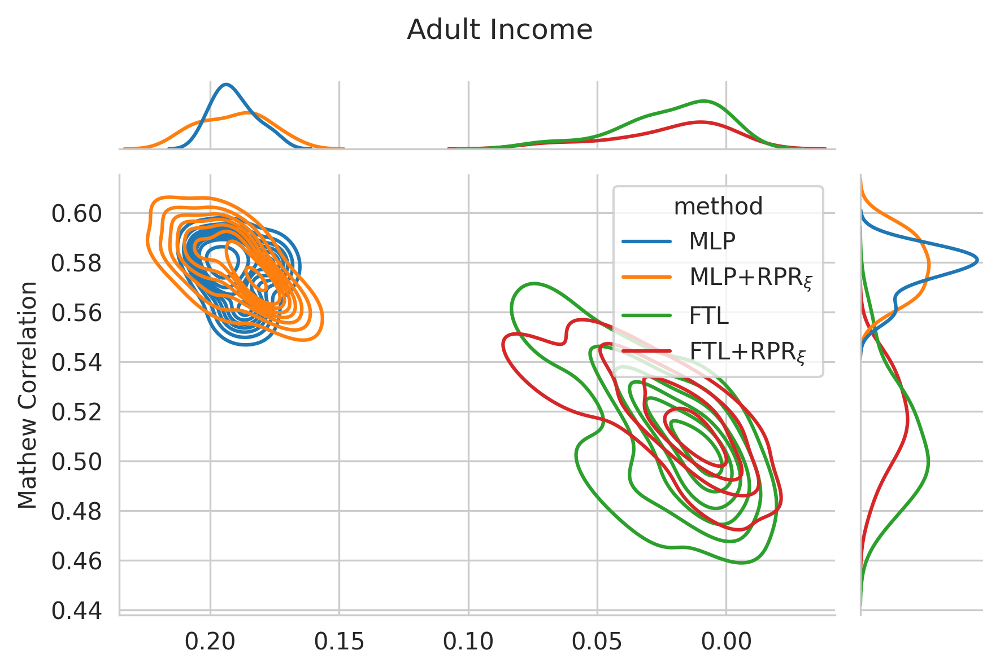

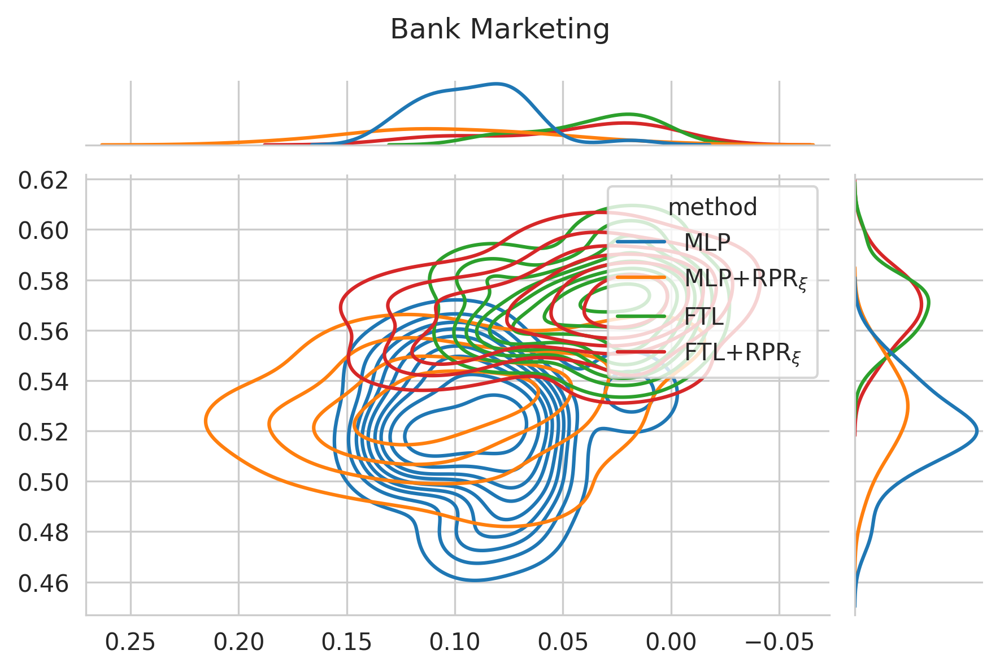

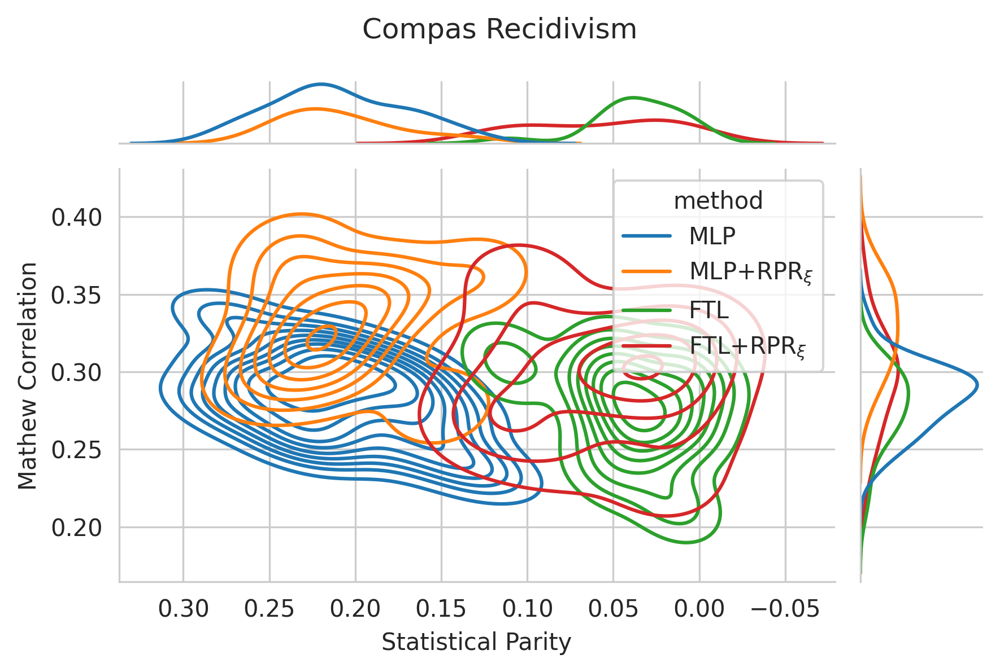

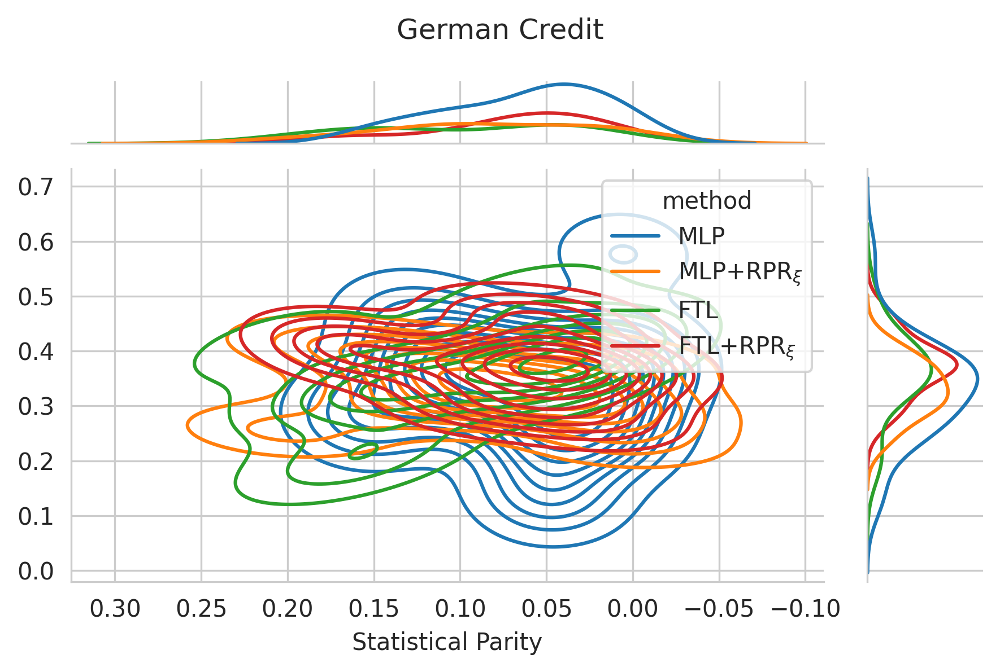

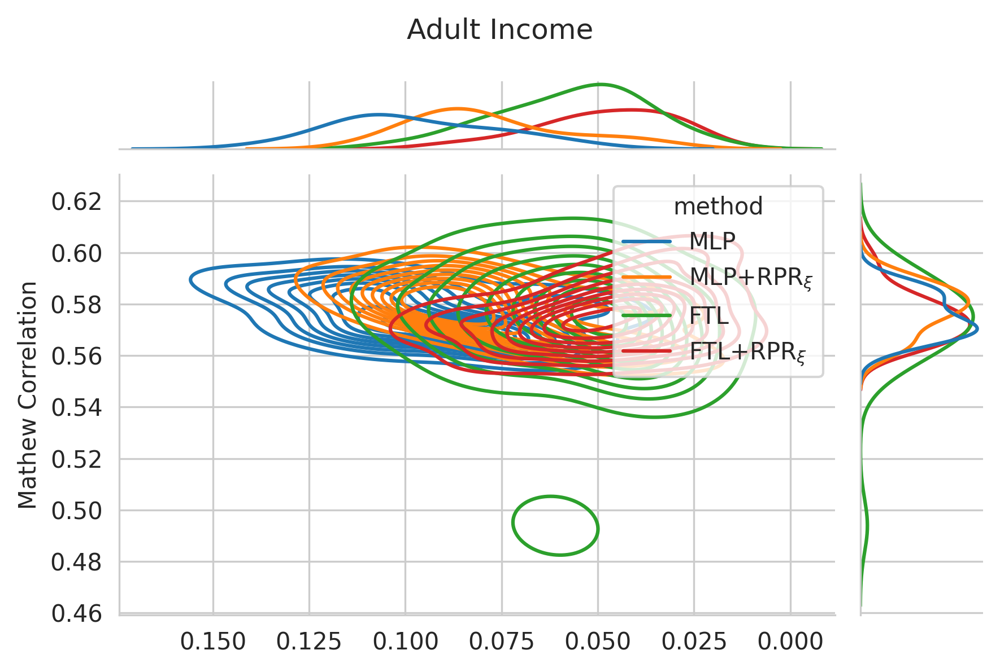

...

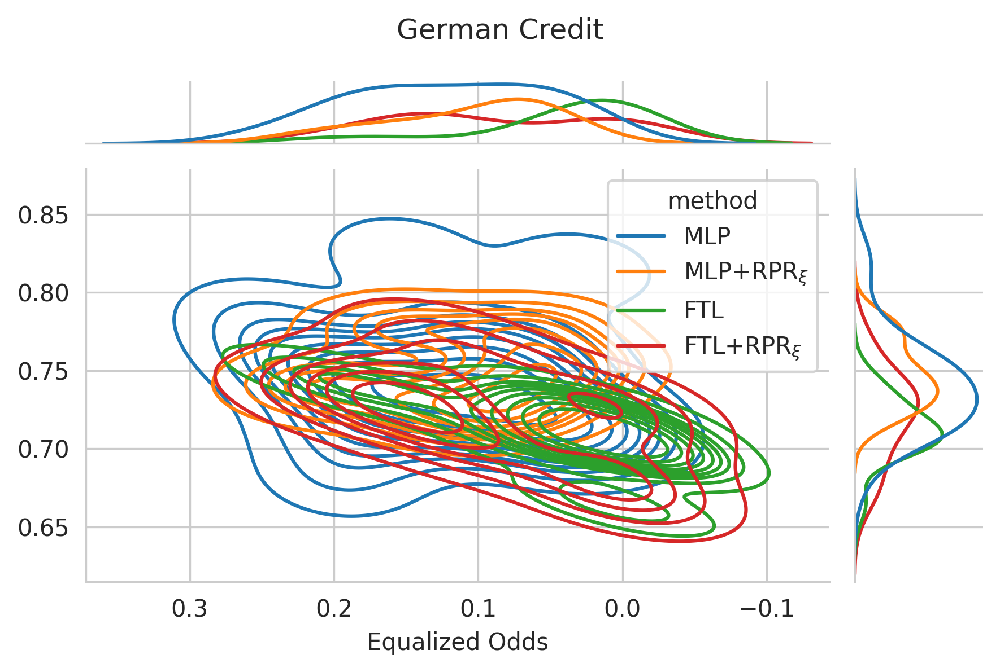

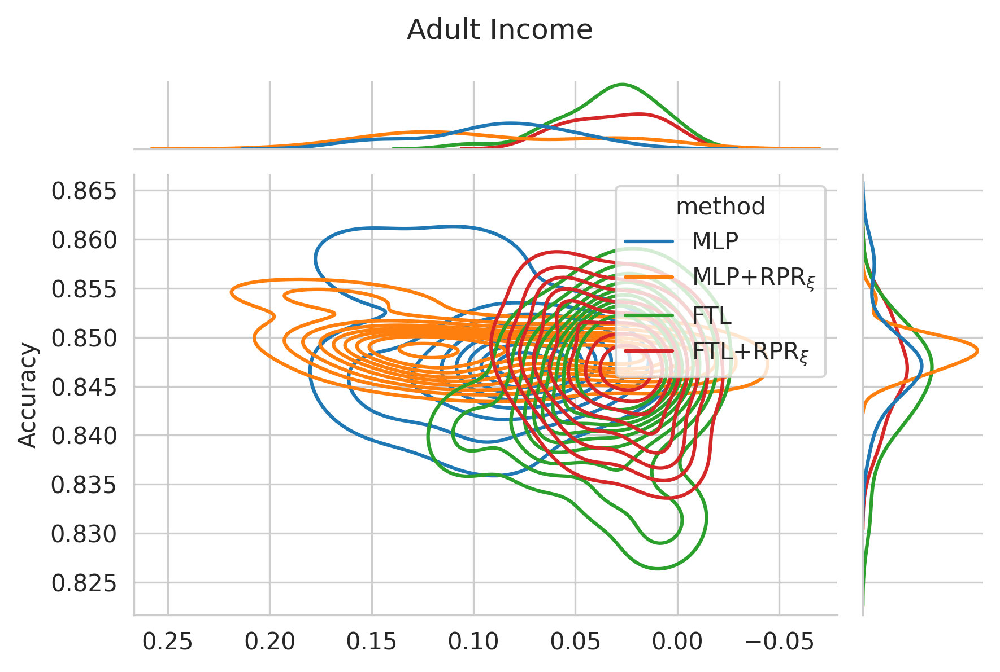

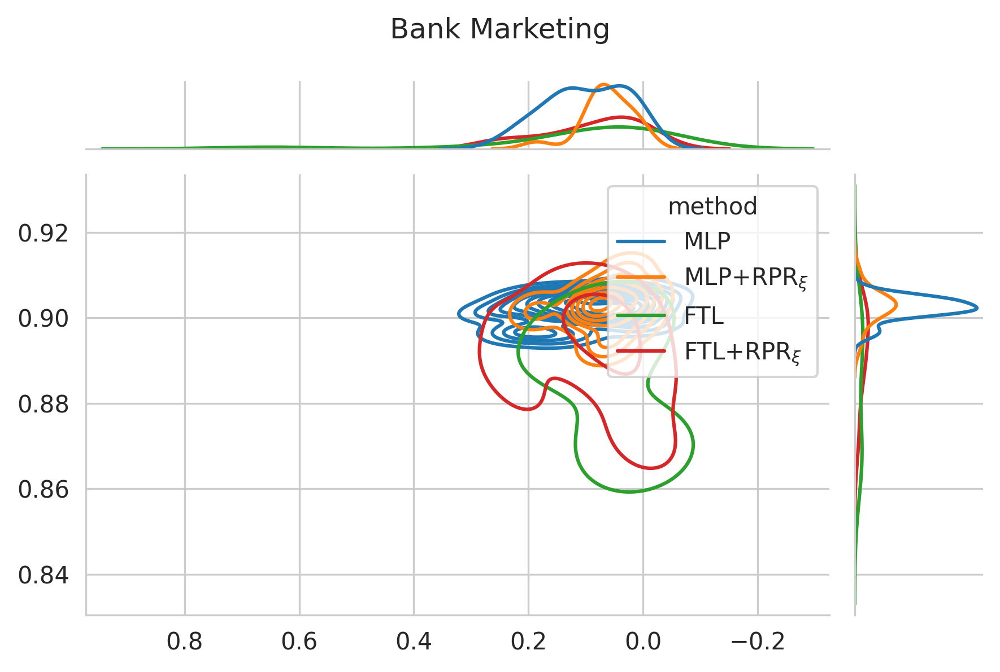

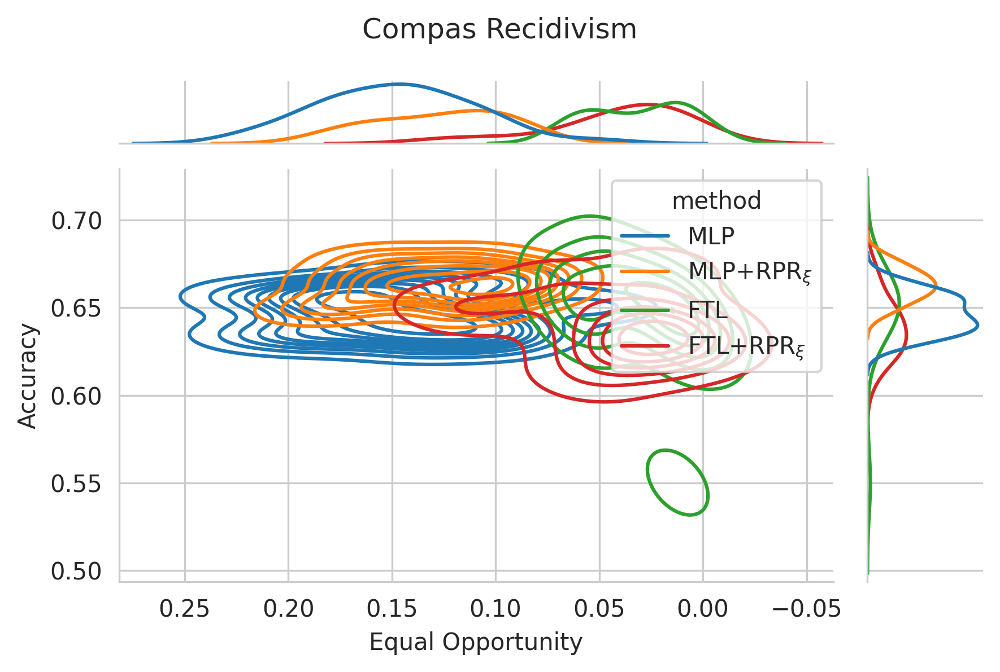

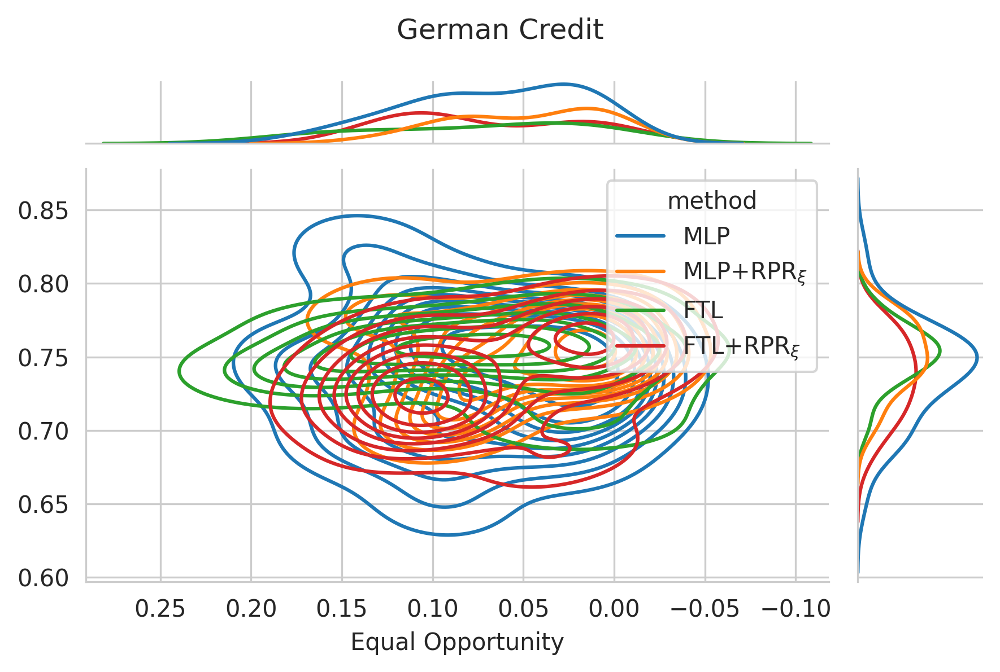

In [30]:
for fitness_rule in fitness_rules:
    for i, dataset in enumerate(sorted(datasets)):
        by_fitness_rule = results[(results.fitness_rule == fitness_rule) & (results.dataset == dataset)].copy()
        by_fitness_rule['method'] = pd.Categorical(by_fitness_rule['method'], categories=methods)

        # Criar o jointplot
        g = sns.jointplot(data=by_fitness_rule, hue='method', x='Fairness', y='Performance', kind="kde")
        
        # inverter eixo X do gráfico principal

        g.ax_joint.invert_xaxis()
        plt.suptitle(dataset)
        
        performance_metric, fairness_metric = fitness_rules_target_metrics[fitness_rule]
        if i == 0:
            g.set_axis_labels('',performance_metric)
        elif i == 1:
            g.set_axis_labels('','')
        elif i == 2:
            g.set_axis_labels(fairness_metric,performance_metric)
        elif i == 3:
            g.set_axis_labels(fairness_metric,'')
        g.fig.set_size_inches(6,4)
        plt.tight_layout()
        plt.savefig(f"plots/pareto_{fitness_rule}_{dataset.split(' ')[0].lower()}_rpr.pdf")
        plt.show()